In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import plotly.graph_objects as go
import numpy as np

In [2]:
df = pd.read_csv('covid_19_data.csv', index_col = ['SNo'])
print(df.head())

    ObservationDate Province/State  Country/Region      Last Update  \
SNo                                                                   
1        01/22/2020          Anhui  Mainland China  1/22/2020 17:00   
2        01/22/2020        Beijing  Mainland China  1/22/2020 17:00   
3        01/22/2020      Chongqing  Mainland China  1/22/2020 17:00   
4        01/22/2020         Fujian  Mainland China  1/22/2020 17:00   
5        01/22/2020          Gansu  Mainland China  1/22/2020 17:00   

     Confirmed  Deaths  Recovered  
SNo                                
1          1.0     0.0        0.0  
2         14.0     0.0        0.0  
3          6.0     0.0        0.0  
4          1.0     0.0        0.0  
5          0.0     0.0        0.0  


In [3]:
# Check data types of each columns
df.dtypes
# Convert values of Observation Date & Last Update Date columns to DateTime value
df['ObservationDate'] = pd.to_datetime(df['ObservationDate'])
df['Last Update'] = pd.to_datetime(df['Last Update']).dt.date
df['Last Update'] = pd.to_datetime(df['Last Update'])
# check data types of these columns again
df.dtypes

ObservationDate    datetime64[ns]
Province/State             object
Country/Region             object
Last Update        datetime64[ns]
Confirmed                 float64
Deaths                    float64
Recovered                 float64
dtype: object

In [4]:
# Strip leading & trailing white space in 'Country/Region' and 'Province/State' columns
df['Country/Region'] = df['Country/Region'].str.strip()
df['Province/State'] = df['Province/State'].str.strip()


# Fixing some typo country names
df['Country/Region'] = df['Country/Region'].replace("('St. Martin',)", 'St. Martin')
df['Country/Region'] = df['Country/Region'].replace("Gambia, The", 'St. Martin')
df['Country/Region'] = df['Country/Region'].replace("Bahamas, The", 'The Bahamas')
df['Country/Region'] = df['Country/Region'].replace("occupied Palestinian territory", 'Palestine')
df['Country/Region'] = df['Country/Region'].replace("East Timor", 'Timor-Leste')
df['Country/Region'] = df['Country/Region'].replace("North Ireland", 'Ireland')


# Check # of countries in the dataset
countries = df['Country/Region'].unique()
print(len(countries))


# Omit records of countries that have less than 15 records as it is not sufficient for analytics
omitCountries = []
for country in countries:
    newCountry = df[df['Country/Region'] == country]
    totalRows = len(newCountry.index)
    if totalRows < 20:
        omitCountries.append(country)
print('Countries to be omitted:', omitCountries)

df = df.set_index('Country/Region') # Temporarily set Country/Region column as index
for country in omitCountries:
    df = df.drop(country, axis = 0)
df = df.reset_index() # Reset index

# Check # of countries again after fixing names
countries = df['Country/Region'].unique()
print(len(countries))


216
Countries to be omitted: ['Saint Barthelemy', 'Faroe Islands', 'Gibraltar', 'Palestine', 'Vatican City', 'French Guiana', 'Martinique', 'Republic of Ireland', 'St. Martin', 'Channel Islands', 'Reunion', 'Cayman Islands', 'Guadeloupe', 'Aruba', 'Jersey', 'Curacao', 'Guernsey', 'Guam', 'Puerto Rico', 'Greenland', 'Mayotte', 'Republic of the Congo', 'The Bahamas', 'The Gambia', 'Cape Verde']
191


In [5]:
# Find out the last date of the dataset
maxDate = df['ObservationDate'].max().strftime('%d/%m/%Y')

# Check to which country has 0 death as of the maxDate
countriesWithNoDeath = []
for country in countries:
    newDf = df[df['Country/Region'] == country]
    if (newDf[newDf['ObservationDate'] == maxDate]['Deaths'] == 0).all():
        countriesWithNoDeath.append(country)
print('There are ', len(countriesWithNoDeath), ' countries that have 0 death. They are', countriesWithNoDeath)


There are  15  countries that have 0 death. They are ['Macau', 'Cambodia', 'Others', 'Bhutan', 'Holy See', 'Mongolia', 'Seychelles', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Timor-Leste', 'Eritrea', 'Dominica', 'Grenada', 'Laos', 'Saint Kitts and Nevis']


In [6]:
# Split Dataset into noDeathCountries & CountriesHaveDeaths

# Create dataframe for noDeathCountries
noDeathCountries = pd.DataFrame()
for country in countriesWithNoDeath:
    newDf = df[df['Country/Region'] == country]
    noDeathCountries = noDeathCountries.append(newDf)

# Check to see if the new dataframe has the correct countries
print('There are ', len(noDeathCountries['Country/Region'].unique()), ' countries that have 0 deaths')

# Create dataframe for CountriesWithDeaths
CountriesWithDeaths = list(set(countries) ^ set(countriesWithNoDeath))
CountriesHaveDeaths = pd.DataFrame()
for country in CountriesWithDeaths:
    newDf = df[df['Country/Region'] == country]
    CountriesHaveDeaths = CountriesHaveDeaths.append(newDf)

# Check to see if the new dataframe has the correct countries
print('There are ', len(CountriesHaveDeaths['Country/Region'].unique()), ' countries that have deaths') # The result should be 213 - 37 = 176


There are  15  countries that have 0 deaths
There are  176  countries that have deaths


In [7]:
# Identify CountriesHaveDeaths with one or more unique Provinces 
countriesWithProvince = CountriesHaveDeaths[(CountriesHaveDeaths['Province/State'].notnull() == True)]['Country/Region'].unique()

# Identify CountriesHaveDeaths with more than one unique Province 
countriesWithMultipleProvinces = []
for country in countriesWithProvince:
    newDf = CountriesHaveDeaths[CountriesHaveDeaths['Country/Region'] == country]
    if len(newDf['Province/State'].unique()) > 1:
        countriesWithMultipleProvinces.append(country)
print("There are ", len(countriesWithMultipleProvinces), " countries that have multiple provinces.")
print("They are ", countriesWithMultipleProvinces)

# Get list of countries with one or no province
countriesWithOneOrNoProvince = list(set(CountriesHaveDeaths['Country/Region'].unique()) ^ set(countriesWithMultipleProvinces))
print("There are ", len(countriesWithOneOrNoProvince), " countries that have one or no province.")  # The result should be 176 - 27 = 149
print("They are ", countriesWithOneOrNoProvince)


There are  27  countries that have multiple provinces.
They are  ['US', 'Israel', 'Austria', 'Italy', 'Sweden', 'Ukraine', 'Iraq', 'Brazil', 'Mexico', 'India', 'France', 'UK', 'Chile', 'Colombia', 'Denmark', 'Peru', 'Spain', 'Japan', 'Mainland China', 'Germany', 'Lebanon', 'Taiwan', 'Pakistan', 'Australia', 'Russia', 'Netherlands', 'Canada']
There are  149  countries that have one or no province.
They are  ['Morocco', 'Burkina Faso', 'Ivory Coast', 'Congo (Brazzaville)', 'Tanzania', 'Egypt', 'Liberia', 'Albania', 'Mauritania', 'Antigua and Barbuda', 'Oman', 'Guinea', 'Vietnam', 'Slovakia', 'Gabon', 'Yemen', 'Iran', 'Dominican Republic', 'Bahamas', 'Uganda', 'Gambia', 'Bulgaria', 'Kyrgyzstan', 'Bosnia and Herzegovina', 'Guinea-Bissau', 'Tajikistan', 'Liechtenstein', 'Nicaragua', 'Chad', 'Singapore', 'Monaco', 'Venezuela', 'Mozambique', 'Czech Republic', 'Turkey', 'Romania', 'Zambia', 'Guatemala', 'Ecuador', 'South Africa', 'Maldives', 'Latvia', 'United Arab Emirates', 'Eswatini', 'Djibo

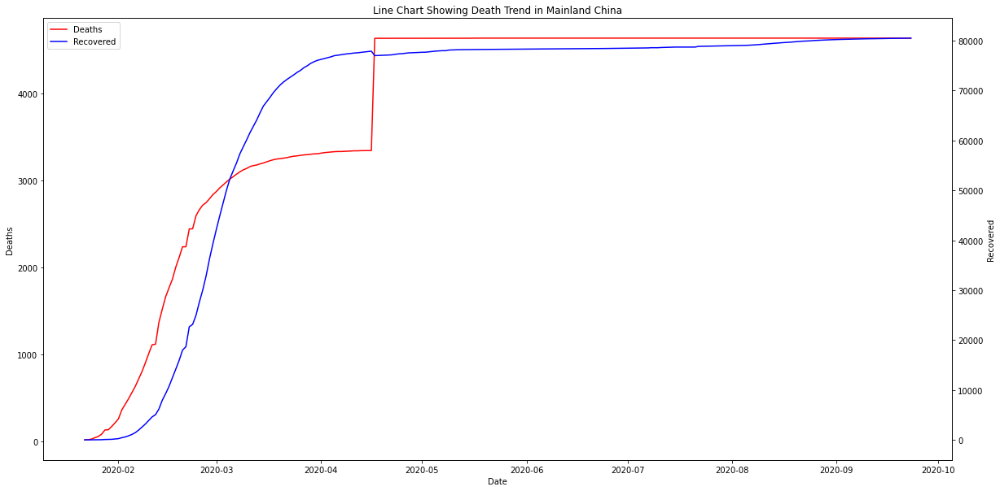

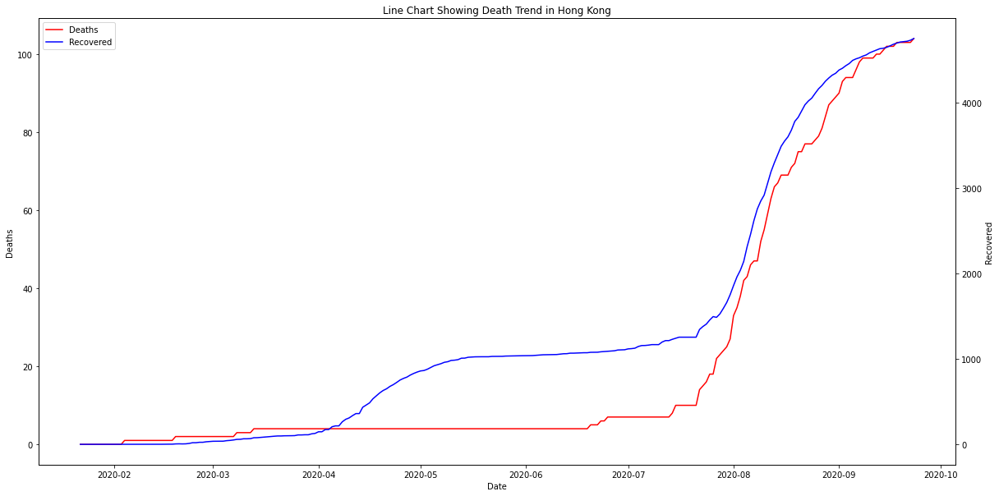

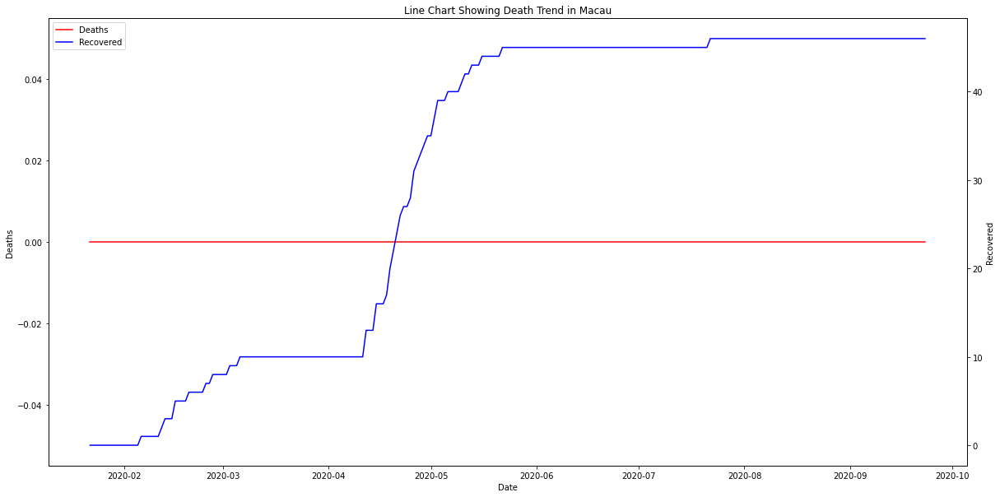

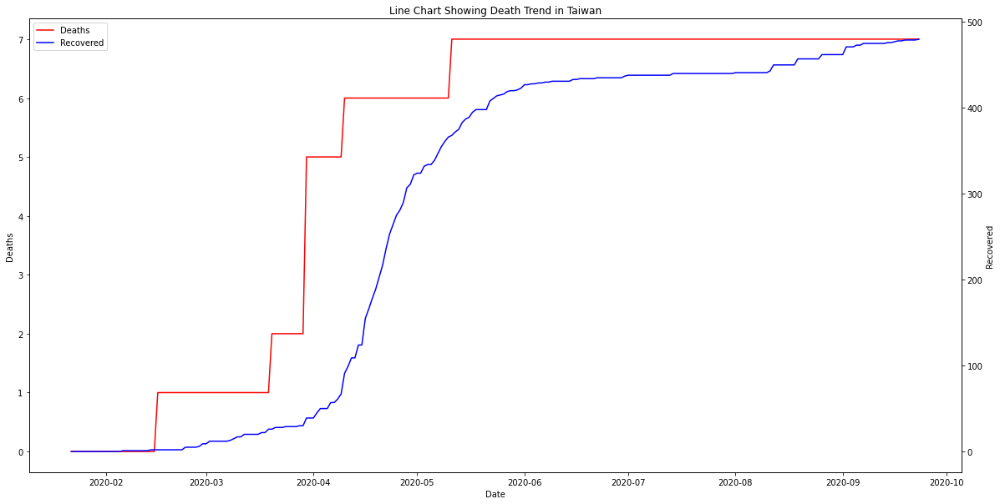

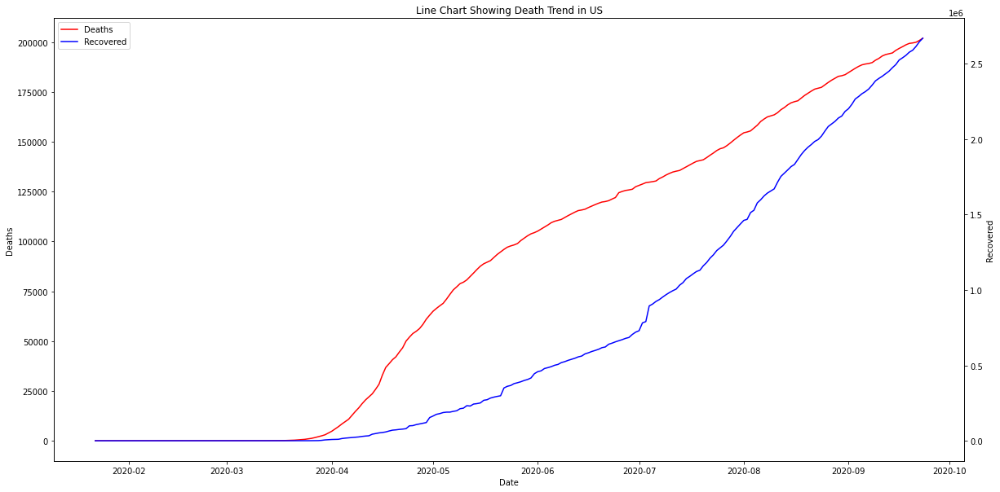

...

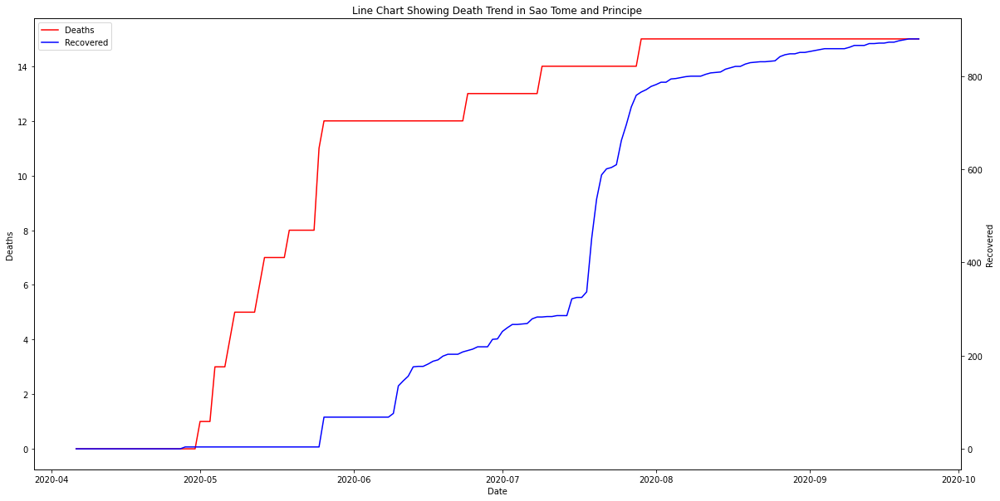

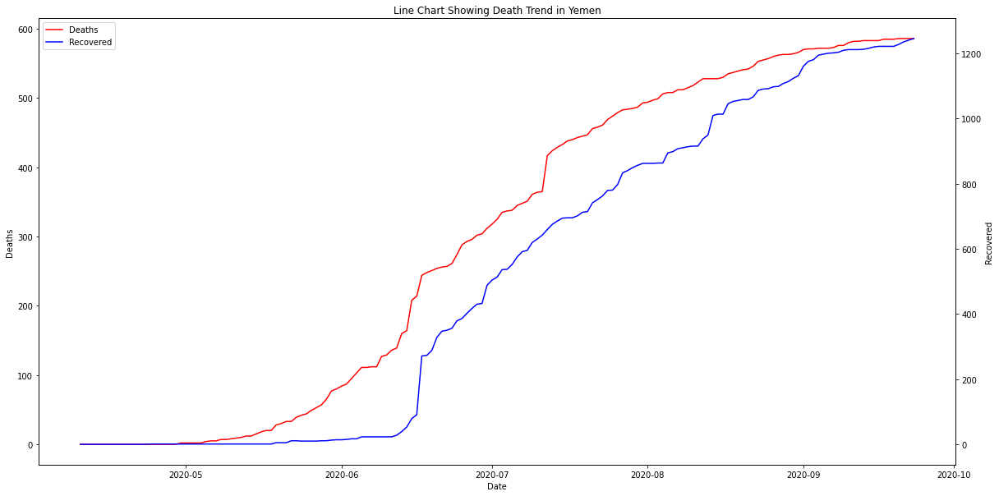

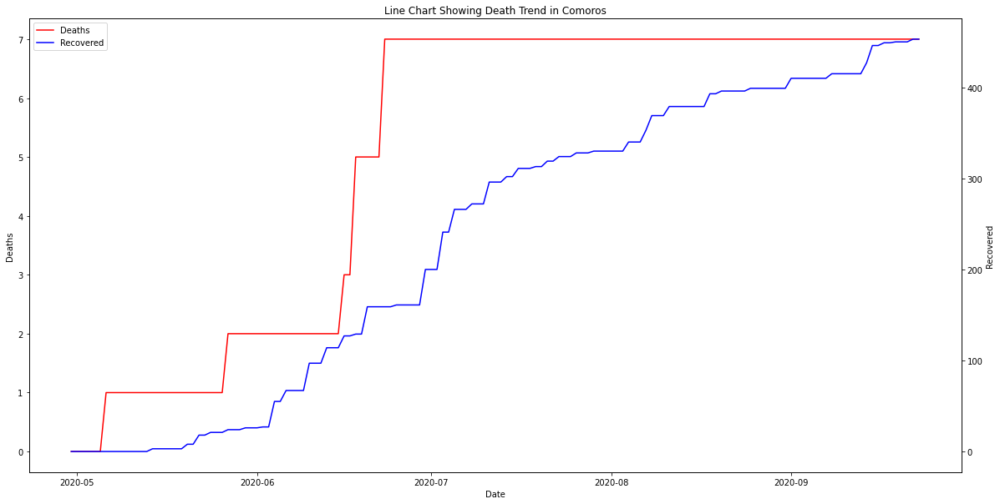

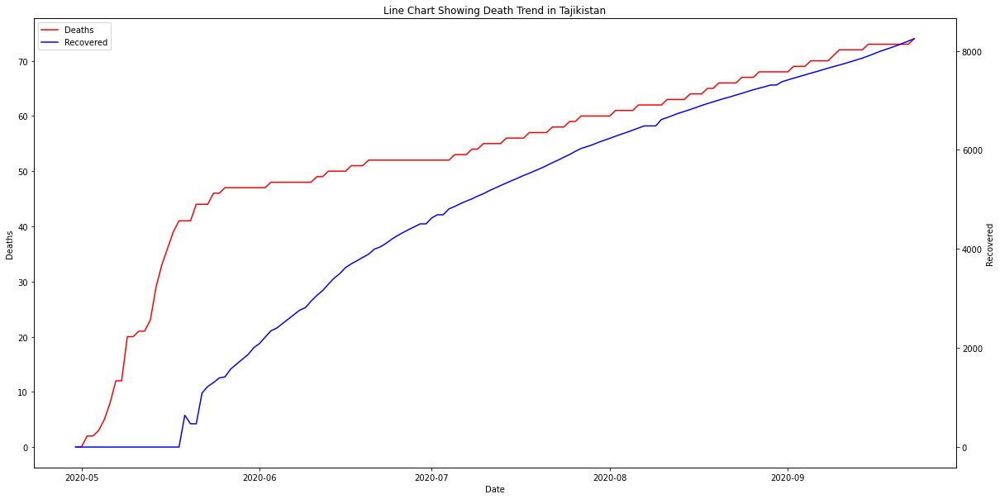

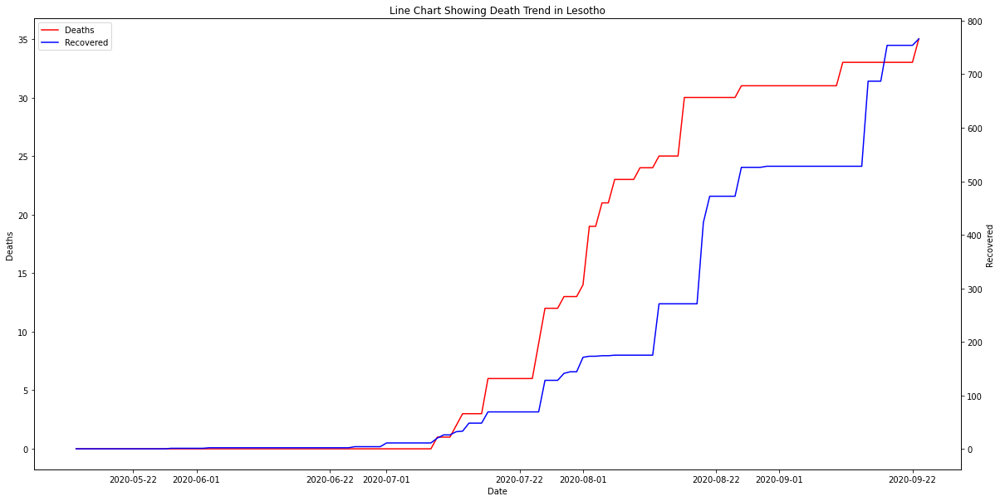

In [8]:
# Creating line chart of death trend for countries 
for country in countries:
    newCountry1 = df[df['Country/Region'] == country]
    newCountry2 = newCountry1.groupby(['ObservationDate']).sum().reset_index()
    fig, ax = plt.subplots(figsize = (20,10))
    plot1, = ax.plot(newCountry2['ObservationDate'], newCountry2['Deaths'], color = 'red', label='Deaths')
    ax.set_xlabel('Date')
    ax.set_ylabel('Deaths')
    ax2 = ax.twinx()
    plot2, = ax2.plot(newCountry2['ObservationDate'], newCountry2['Recovered'], color = 'blue',label='Recovered')
    ax2.set_ylabel('Recovered')
    ax2.legend(handles = [plot1, plot2], loc = 'upper left')
    ax.set_title('Line Chart Showing Death Trend in ' + str(country))
    plt.show()

In [9]:
# Create a dataframe in which each country only has one record on the lastest updated date
df1 = df.groupby(['Country/Region','ObservationDate']).sum().reset_index()
df4 = pd.DataFrame(columns = ['Country/Region', 'ObservationDate', 'Confirmed','Deaths','Recovered'])
for country in countries:
    df2 = df1[df1['Country/Region'] == country]
    df3 = df2[df2['ObservationDate'] == df2['ObservationDate'].max()].reset_index(drop=True)
    df4 = df4.append(df3, ignore_index = True)
    df4 = df4.sort_values('Country/Region')
print(df4)


         Country/Region ObservationDate  Confirmed  Deaths  Recovered
0           Afghanistan      2020-09-23    39145.0  1446.0    32610.0
1               Albania      2020-09-23    12787.0   370.0     7139.0
2               Algeria      2020-09-23    50400.0  1698.0    35428.0
3               Andorra      2020-09-23     1753.0    53.0     1203.0
4                Angola      2020-09-23     4363.0   159.0     1473.0
..                  ...             ...        ...     ...        ...
185  West Bank and Gaza      2020-09-23    37083.0   272.0    26288.0
186      Western Sahara      2020-09-23       10.0     1.0        8.0
187               Yemen      2020-09-23     2029.0   586.0     1245.0
188              Zambia      2020-09-23    14443.0   332.0    13629.0
189            Zimbabwe      2020-09-23     7725.0   227.0     6007.0

[191 rows x 5 columns]


In [10]:
fig = go.Figure(data=go.Choropleth(
    locations=df4['Country/Region'], # Spatial coordinates
    z = df4['Deaths'], # Data to be color-coded
    locationmode = 'country names', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "# of deaths",
))

fig.update_layout(
    title_text = "World's Death Statistics Due to Coronavirus",
    geo_scope='world', # limite map scope to USA
)

fig.show()
#Note that not all countries have the same latest updated date

In [11]:
fig = go.Figure(data=go.Choropleth(
    locations=df4['Country/Region'], # Spatial coordinates
    z = df4['Recovered'], # Data to be color-coded
    locationmode = 'country names', # set of locations match entries in `locations`
    colorscale = 'Blues',
    colorbar_title = "# of recoveries",
))

fig.update_layout(
    title_text = "World's Recovered Statistics Due to Coronavirus",
    geo_scope='world', # limite map scope to USA
)

fig.show()

#Recovered Data of US is not accurate

In [12]:
fig = go.Figure(data=go.Choropleth(
    locations=df4['Country/Region'], # Spatial coordinates
    z = df4['Confirmed'], # Data to be color-coded
    locationmode = 'country names', # set of locations match entries in `locations`
    colorscale = 'Greens',
    colorbar_title = "# of Confirmed Cases",
))

fig.update_layout(
    title_text = "World's Infected Cases Due to Coronavirus",
    geo_scope='world', # limite map scope to USA
)

fig.show()


In [13]:
# Add 3 more columns to the df4 dataframe 
df4['activeCases'] = df4['Confirmed'] - df4['Deaths'] - df4['Recovered']
df4['deathRate'] = (df4['Deaths']/df4['Confirmed']) * 100
df4['recoveryRate'] = (df4['Recovered']/df4['Confirmed']) * 100
df4['activeCasesRate'] = (df4['activeCases']/df4['Confirmed']) * 100
df4


,Country/Region,ObservationDate,Confirmed,Deaths,Recovered,activeCases,deathRate,recoveryRate,activeCasesRate
0,Afghanistan,2020-09-23,39145.0,1446.0,32610.0,5089.0,3.693958,83.305658,13.000383
1,Albania,2020-09-23,12787.0,370.0,7139.0,5278.0,2.893564,55.830140,41.276296
2,Algeria,2020-09-23,50400.0,1698.0,35428.0,13274.0,3.369048,70.293651,26.337302
3,Andorra,2020-09-23,1753.0,53.0,1203.0,497.0,3.023388,68.625214,28.351398
4,Angola,2020-09-23,4363.0,159.0,1473.0,2731.0,3.644281,33.761174,62.594545
...,...,...,...,...,...,...,...,...,...
185,West Bank and Gaza,2020-09-23,37083.0,272.0,26288.0,10523.0,0.733490,70.889626,28.376884
186,Western Sahara,2020-09-23,10.0,1.0,8.0,1.0,10.000000,80.000000,10.000000
187,Yemen,2020-09-23,2029.0,586.0,1245.0,198.0,28.881222,61.360276,9.758502
188,Zambia,2020-09-23,14443.0,332.0,13629.0,482.0,2.298691,94.364052,3.337257


In [15]:
fig = go.Figure()
fig.add_trace(go.Bar(
    y=df4['deathRate'],
    x=df4['Country/Region'],
    name="Death %",
    marker=dict(
        color='rgba(0,128,0, 0.6)',
        line=dict(color='rgba(0,128,0, 0.5)', width=0.05)
    )
))
fig.add_trace(go.Bar(
    y=df4['recoveryRate'],
    x=df4['Country/Region'],
    name="Recovery %",
    marker=dict(
        color='rgba(0,0,255, 0.6)',
        line=dict(color='rgba(0,0,255, 0.5)', width=0.05)
    )
))
fig.add_trace(go.Bar(
    y=df4['activeCasesRate'],
    x=df4['Country/Region'],
    name="Active %",
    marker=dict(
        color='rgba(128,0,0, 0.5)',
        line=dict(color='rgba(128,0,0, 0.5)', width=0.05)
    )
))
fig.update_layout(
        yaxis=dict(
        title_text="Marks %",
        ticktext=["0%", "20%", "40%", "60%","80%","100%"],
        tickvals=[0, 20, 40, 60, 80, 100],
        tickmode="array",
        titlefont=dict(size=15),
    ),
    autosize=False,
    width=1000,
    height=400,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    title={
        'text': "Coronavirus's Active, Death & Recovery Rate of All Countries",
        'y':0.96,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    barmode='stack')
fig.show()



In [26]:
# Calculate the overall death rate and recovery rate of all countries
worldDeathRate = round(((df4['Deaths'].sum()/df4['Confirmed'].sum()) * 100),2)
worldRecoveryRate = round(((df4['Recovered'].sum()/df4['Confirmed'].sum()) * 100),2)
print("The Coronavirus's world death rate is {}%".format(worldDeathRate))
print("The Coronavirus's world recovery rate is {}%".format(worldRecoveryRate))

The Coronavirus's world death rate is 3.07%
The Coronavirus's world recovery rate is 68.88%
